In [2]:
import pandas as pd
import plotly.express as px
import nbformat
import folium
import numpy as np
from sklearn.cluster import KMeans
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN
from scipy.spatial.distance import cdist
from itertools import permutations
from geopy.distance import great_circle
import seaborn as sns
import random
from geopy.distance import geodesic
import networkx as nx

In [3]:
df_ec = pd.read_csv('C:/Users/jmana/OneDrive/Documentos/RTM_Project/dados/df_ec_top_pocs_novo.csv')

In [4]:
df = df_ec.copy()
df

,COUNTRY_NAME,POC,Vendedor,Frequência_de_Visita,Dia_da_Visita,Semana_da_Visita,AVG_LATITUDE,AVG_LONGITUDE,Número_de_Compras,Faturamento_Mensal_USD,Faturamento_Mensal_USD_(formatado),Visita_Semanal,Semana_1,Semana_2,Semana_3,Semana_4,Dia_da_Semana,Quartil_Faturamento
0,EC,11802893,ECECB614,2,4,1.0,-1.116441,-80.403880,5,655.51,$655.51,0.50,1,0,0,0,qua,Q3
1,EC,11803224,ECECB011,2,5,1.0,-3.553245,-80.064513,6,808.20,$808.20,0.50,1,0,0,0,qui,Q3
2,EC,11803330,ECECB276,2,4,1.0,-2.740126,-78.845570,8,584.77,$584.77,0.50,1,0,0,0,qua,Q2
3,EC,11803418,ECECB274,2,5,2.0,-2.806572,-78.773606,3,777.05,$777.05,0.50,0,1,0,0,qui,Q3
4,EC,11803517,ECECB282,4,3,CMPL,-2.742844,-78.849740,8,103820.37,"$103,820.37",1.00,1,1,1,1,ter,Q4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44038,EC,14236381,ECECBA18,1,3,3.0,-3.324675,-79.720375,3,696.40,$696.40,0.25,0,0,1,0,ter,Q3
44039,EC,14237231,ECECB337,1,2,4.0,-0.307164,-78.454020,3,792.76,$792.76,0.25,0,0,0,1,seg,Q3
44040,EC,14237651,ECECB044,2,6,2.0,-1.281191,-78.640096,1,620.63,$620.63,0.50,0,1,0,0,sex,Q3
44041,EC,14239714,ECECB061,1,6,3.0,-0.436454,-76.992425,5,265.45,$265.45,0.25,0,0,1,0,sex,Q1


In [5]:
df["Vendedor"].nunique()

418

 **1- Clusters de POCs (Clusterização Geográfica Melhorada)**

In [6]:
# **Etapa 1 - Clusters de POCs (Clusterização Geográfica Melhorada)**
df["AVG_LATITUDE"] = pd.to_numeric(df["AVG_LATITUDE"], errors="coerce")
df["AVG_LONGITUDE"] = pd.to_numeric(df["AVG_LONGITUDE"], errors="coerce")
df = df.dropna(subset=["AVG_LATITUDE", "AVG_LONGITUDE"])
num_clusters = df["Vendedor"].nunique()  # 418 clusters
coords = df[["AVG_LATITUDE", "AVG_LONGITUDE"]].values
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
df["Cluster"] = kmeans.fit_predict(coords)

# Calcular distâncias dentro de cada cluster (aproximação inicial)
df[["Delta_Lat", "Delta_Lon"]] = df.groupby("Cluster")[["AVG_LATITUDE", "AVG_LONGITUDE"]].diff().abs()
df["Distância_Km_Lat"] = df["Delta_Lat"] * 111
df["Distância_Km_Lon"] = df["Delta_Lon"] * 111 * np.cos(np.radians(df["AVG_LATITUDE"]))
df["Distância_Total_Km"] = df["Distância_Km_Lat"] + df["Distância_Km_Lon"]
df["Distância_Total_Km"] = df["Distância_Total_Km"].fillna(0)
media_dist_por_cluster = df.groupby("Cluster")["Distância_Total_Km"].transform(lambda x: x[x > 0].mean())
df.loc[df.groupby("Cluster").head(1).index, "Distância_Total_Km"] = media_dist_por_cluster

**2- Distribuição de Vendedores por Cluster**

In [7]:
# **Etapa 2 - Distribuição Inicial com Limites**
vendedores_coords = df.groupby("Vendedor")[["AVG_LATITUDE", "AVG_LONGITUDE"]].mean().dropna()
clusters_coords = df.groupby("Cluster")[["AVG_LATITUDE", "AVG_LONGITUDE"]].mean().dropna()
dist_matrix = cdist(clusters_coords, vendedores_coords, metric="euclidean")
dist_df = pd.DataFrame(dist_matrix, index=clusters_coords.index, columns=vendedores_coords.index)

LIMITE_VISITAS_DIA = 12  # 12 visitas/dia
LIMITE_TEMPO_DIA = 480   # 8h em minutos
LIMITE_DISTANCIA_KM = 50 # Reduzido para evitar deslocamentos longos
LIMITE_DISTANCIA_DIARIA = 150  # 150 km/dia
TEMPO_VISITA = 10        # 10 min por visita
VELOCIDADE_MEDIA = 50    # 50 km/h
DIAS_SEMANA = ["seg", "ter", "qua", "qui", "sex", "sab"]

visitas_por_vendedor = {vendedor: {dia: 0 for dia in DIAS_SEMANA} for vendedor in df["Vendedor"].unique()}
distancias_por_vendedor = {vendedor: {dia: 0 for dia in DIAS_SEMANA} for vendedor in df["Vendedor"].unique()}
cluster_vendedor_map = {}
for cluster in clusters_coords.index:
    vendedores_ordenados = dist_df.loc[cluster].sort_values().index.tolist()
    visitas_cluster = df[df["Cluster"] == cluster]["Frequência_de_Visita"].sum()
    distancia_cluster = df[df["Cluster"] == cluster]["Distância_Total_Km"].sum()
    for vendedor in vendedores_ordenados:
        distancia_centroide = dist_df.loc[cluster, vendedor] * 111
        if distancia_centroide <= LIMITE_DISTANCIA_KM:
            cluster_vendedor_map[cluster] = vendedor
            visitas_por_vendedor[vendedor]["seg"] += visitas_cluster
            distancias_por_vendedor[vendedor]["seg"] += distancia_cluster
            break
    else:
        vendedor = vendedores_ordenados[0]
        cluster_vendedor_map[cluster] = vendedor
        visitas_por_vendedor[vendedor]["seg"] += visitas_cluster
        distancias_por_vendedor[vendedor]["seg"] += distancia_cluster
df["Vendedor_Atribuído"] = df["Cluster"].map(cluster_vendedor_map)

**3- Cálculo de Pareto Global (Correção do Top 20%)**

In [8]:
# **Etapa 3 - Cálculo de Pareto Global**
df["Faturamento_Mensal_USD"] = pd.to_numeric(df["Faturamento_Mensal_USD"], errors="coerce")
df["Alto_Valor"] = df["Quartil_Faturamento"] == "Q4"

**4- Frequência Otimizada de Visitas**

In [9]:
# **Etapa 4 - Frequência Otimizada de Visitas**
df["Frequência_Ajustada"] = 0.0
df.loc[df["Quartil_Faturamento"] == "Q4", "Frequência_Ajustada"] = 4.0
df.loc[df["Quartil_Faturamento"] == "Q3", "Frequência_Ajustada"] = 3.0
df.loc[df["Quartil_Faturamento"] == "Q2", "Frequência_Ajustada"] = 2.0
df.loc[df["Quartil_Faturamento"] == "Q1", "Frequência_Ajustada"] = 1.5
print("Frequência_Ajustada após Etapa 4:", df["Frequência_Ajustada"].describe())

Frequência_Ajustada após Etapa 4: count    44043.000000
mean         2.624957
std          0.960194
min          1.500000
25%          1.500000
50%          2.000000
75%          3.500000
max          4.000000
Name: Frequência_Ajustada, dtype: float64


**5- Comparação de RTM (Antes e Depois da Otimização)**

In [10]:
# **Etapa 5 - Redistribuição com Limites Semanais**
df["Dia_da_Semana"] = np.nan  # Resetar dias
for vendedor in df["Vendedor_Atribuído"].unique():
    df_vendedor = df[df["Vendedor_Atribuído"] == vendedor].copy()
    visitas_totais = df_vendedor["Frequência_Ajustada"].sum()
    visitas_diarias_max = min(LIMITE_VISITAS_DIA, visitas_totais / len(DIAS_SEMANA))

    # Resetar dicionários
    for dia in DIAS_SEMANA:
        visitas_por_vendedor[vendedor][dia] = 0
        distancias_por_vendedor[vendedor][dia] = 0

    # Atribuir todos os POCs inicialmente ao dia com menos visitas
    for idx, row in df_vendedor.iterrows():
        dia_atribuido = min(DIAS_SEMANA, key=lambda d: visitas_por_vendedor[vendedor][d])
        df.at[idx, "Dia_da_Semana"] = dia_atribuido.capitalize()
        visitas_por_vendedor[vendedor][dia_atribuido] += row["Frequência_Ajustada"]
        distancias_por_vendedor[vendedor][dia_atribuido] += row["Distância_Total_Km"]

    # Redistribuir para respeitar limites
    for dia in DIAS_SEMANA:
        while visitas_por_vendedor[vendedor][dia] > visitas_diarias_max or \
              (visitas_por_vendedor[vendedor][dia] * TEMPO_VISITA + (distancias_por_vendedor[vendedor][dia] / VELOCIDADE_MEDIA) * 60) > LIMITE_TEMPO_DIA:
            # Usar pd.isna() para tratar NaN e evitar .str em colunas mistas
            pocs_dia = df_vendedor[df_vendedor["Dia_da_Semana"].apply(lambda x: str(x).lower() == dia)].index
            if not pocs_dia.empty:
                poc = pocs_dia[0]
                visitas_poc = df_vendedor.at[poc, "Frequência_Ajustada"]
                distancia_poc = df_vendedor.at[poc, "Distância_Total_Km"]
                tempo_deslocamento = (distancia_poc / VELOCIDADE_MEDIA) * 60
                tempo_visitas = visitas_poc * TEMPO_VISITA
                for novo_dia in DIAS_SEMANA:
                    if novo_dia != dia:
                        visitas_atuais = visitas_por_vendedor[vendedor][novo_dia]
                        distancia_atual = distancias_por_vendedor[vendedor][novo_dia]
                        tempo_total = tempo_deslocamento + tempo_visitas + (visitas_atuais * TEMPO_VISITA)
                        if (visitas_atuais + visitas_poc <= visitas_diarias_max) and \
                           (tempo_total <= LIMITE_TEMPO_DIA) and \
                           (distancia_atual + distancia_poc <= LIMITE_DISTANCIA_DIARIA):
                            df.at[poc, "Dia_da_Semana"] = novo_dia.capitalize()
                            visitas_por_vendedor[vendedor][novo_dia] += visitas_poc
                            distancias_por_vendedor[vendedor][novo_dia] += distancia_poc
                            visitas_por_vendedor[vendedor][dia] -= visitas_poc
                            distancias_por_vendedor[vendedor][dia] -= distancia_poc
                            break

C:\Users\jmana\AppData\Local\Temp\ipykernel_22012\3140176241.py:16: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Seg' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.at[idx, "Dia_da_Semana"] = dia_atribuido.capitalize()


KeyboardInterrupt: 

In [ ]:
# Resultados finais
visitas_finais_por_vendedor = {vendedor: sum(visitas.values()) for vendedor, visitas in visitas_por_vendedor.items()}
print("\nVisitas por vendedor após redistribuição (top 30):")
print(pd.Series(visitas_finais_por_vendedor).sort_values(ascending=False).head(30))


Visitas por vendedor após redistribuição (top 30):
ECECB540    72.0
ECECBA53    72.0
ECECBA36    72.0
ECECB082    72.0
ECECB067    72.0
ECECB075    72.0
ECECB570    72.0
ECECB590    72.0
ECECB588    72.0
ECECB463    72.0
ECECB297    72.0
ECECBA87    72.0
ECECB594    72.0
ECECB514    72.0
ECECB034    72.0
ECECB077    72.0
ECECB323    72.0
ECECB534    72.0
ECECB558    72.0
ECECB105    72.0
ECECB332    72.0
ECECBA81    72.0
ECECB339    72.0
ECECB334    72.0
ECECB018    72.0
ECECB189    72.0
ECECB581    72.0
ECECB271    72.0
ECECB024    72.0
ECECB004    72.0
dtype: float64


In [ ]:
print(pd.Series(visitas_finais_por_vendedor).sort_values(ascending=False).head(30))
print("Soma total de Frequência_Ajustada:", df["Frequência_Ajustada"].sum())

ECECB540    72.0
ECECBA53    72.0
ECECBA36    72.0
ECECB082    72.0
ECECB067    72.0
ECECB075    72.0
ECECB570    72.0
ECECB590    72.0
ECECB588    72.0
ECECB463    72.0
ECECB297    72.0
ECECBA87    72.0
ECECB594    72.0
ECECB514    72.0
ECECB034    72.0
ECECB077    72.0
ECECB323    72.0
ECECB534    72.0
ECECB558    72.0
ECECB105    72.0
ECECB332    72.0
ECECBA81    72.0
ECECB339    72.0
ECECB334    72.0
ECECB018    72.0
ECECB189    72.0
ECECB581    72.0
ECECB271    72.0
ECECB024    72.0
ECECB004    72.0
dtype: float64
Soma total de Frequência_Ajustada: 115611.0


In [ ]:
print("Média de Frequência_Ajustada por POC:", df["Frequência_Ajustada"].sum() / len(df))
print("Número de vendedores com visitas:", len([v for v, total in visitas_finais_por_vendedor.items() if total > 0]))
print("Máximo de visitas por vendedor:", max(visitas_finais_por_vendedor.values()))
print("Mínimo de visitas por vendedor:", min(v for v in visitas_finais_por_vendedor.values() if v > 0))
print("Média de visitas por vendedor:", np.mean([v for v in visitas_finais_por_vendedor.values() if v > 0]))
print("POCs sem vendedor atribuído:", df["Vendedor_Atribuído"].isna().sum())

Média de Frequência_Ajustada por POC: 2.624957427968122
Número de vendedores com visitas: 249
Máximo de visitas por vendedor: 72.0
Mínimo de visitas por vendedor: 18.0
Média de visitas por vendedor: 68.98795180722891
POCs sem vendedor atribuído: 0


In [ ]:
df

,COUNTRY_NAME,POC,Vendedor,Frequência_de_Visita,Dia_da_Visita,Semana_da_Visita,AVG_LATITUDE,AVG_LONGITUDE,Número_de_Compras,Faturamento_Mensal_USD,...,Quartil_Faturamento,Cluster,Delta_Lat,Delta_Lon,Distância_Km_Lat,Distância_Km_Lon,Distância_Total_Km,Vendedor_Atribuído,Alto_Valor,Frequência_Ajustada
0,EC,11802893,ECECB614,2,4,1.0,-1.116441,-80.403880,5,655.51,...,Q3,379,NaN,NaN,NaN,NaN,6.033922,ECECBA48,False,3.0
1,EC,11803224,ECECB011,2,5,1.0,-3.553245,-80.064513,6,808.20,...,Q3,330,NaN,NaN,NaN,NaN,2.000196,ECECB011,False,3.0
2,EC,11803330,ECECB276,2,4,1.0,-2.740126,-78.845570,8,584.77,...,Q2,213,NaN,NaN,NaN,NaN,4.565120,ECECB173,False,2.0
3,EC,11803418,ECECB274,2,5,2.0,-2.806572,-78.773606,3,777.05,...,Q3,81,NaN,NaN,NaN,NaN,4.632807,ECECB274,False,3.0
4,EC,11803517,ECECB282,4,3,CMPL,-2.742844,-78.849740,8,103820.37,...,Q4,213,0.002719,0.004170,0.301787,0.462306,0.764092,ECECB282,True,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44038,EC,14236381,ECECBA18,1,3,3.0,-3.324675,-79.720375,3,696.40,...,Q3,354,0.032788,0.039207,3.639507,4.344602,7.984109,ECECBA18,False,3.0
44039,EC,14237231,ECECB337,1,2,4.0,-0.307164,-78.454020,3,792.76,...,Q3,317,0.007569,0.003837,0.840212,0.425859,1.266071,ECECB025,False,3.0
44040,EC,14237651,ECECB044,2,6,2.0,-1.281191,-78.640096,1,620.63,...,Q3,349,0.015407,0.034251,1.710144,3.800949,5.511093,ECECB337,False,3.0
44041,EC,14239714,ECECB061,1,6,3.0,-0.436454,-76.992425,5,265.45,...,Q1,373,0.010131,0.009644,1.124585,1.070497,2.195083,ECECB061,False,1.5


**Mapa geral**

In [ ]:
import folium
import numpy as np
import pandas as pd

# Criar um mapa centralizado na média das coordenadas
map_center = [df["AVG_LATITUDE"].mean(), df["AVG_LONGITUDE"].mean()]
mapa_clusters = folium.Map(location=map_center, zoom_start=6, tiles="OpenStreetMap")

# Criar um dicionário de cores para os clusters
clusters_unicos = df["Cluster"].unique()
cores = ["#" + ''.join(np.random.choice(list('0123456789ABCDEF'), 6)) for _ in range(len(clusters_unicos))]
cluster_cores = dict(zip(clusters_unicos, cores))

# Criar FeatureGroup para cada cluster
clusters_feature = {cluster: folium.FeatureGroup(name=f"Cluster {cluster}") for cluster in clusters_unicos}

# Adicionar POCs ao mapa coloridos pelos clusters
for _, row in df.iterrows():
    cluster = row["Cluster"]
    if pd.notna(row["AVG_LATITUDE"]) and pd.notna(row["AVG_LONGITUDE"]):
        # Garantir que as colunas existam e tratar valores ausentes
        poc = row.get("POC", "N/A")
        vendedor = row.get("Vendedor_Atribuído", "N/A")
        faturamento = row.get("Faturamento_Mensal_USD", 0)
        distancia = row.get("Distância_Total_Km", 0)
        dia_visita = row.get("Dia_da_Semana", "N/A")  # Usando Dia_da_Semana como no seu exemplo
        frequencia = row.get("Frequência_Ajustada", 0)

        folium.CircleMarker(
            location=[row["AVG_LATITUDE"], row["AVG_LONGITUDE"]],
            radius=5,
            color=cluster_cores[cluster],
            fill=True,
            fill_color=cluster_cores[cluster],
            fill_opacity=0.7,
            popup=folium.Popup(f"""
                <b>Cluster:</b> {cluster} <br>
                <b>Vendedor:</b> {vendedor} <br>
                <b>POC:</b> {poc} <br>
                <b>Faturamento:</b> ${faturamento:.2f} <br>
                <b>Distância:</b> {distancia:.2f} km <br>
                <b>Dia da Visita:</b> {dia_visita} <br>
                <b>Frequência de Visita:</b> {frequencia} vezes/mês
            """, max_width=250),
        ).add_to(clusters_feature[cluster])

# Adicionar grupos ao mapa
for cluster in clusters_feature.values():
    cluster.add_to(mapa_clusters)

# Adicionar marcadores para os vendedores
vendedores_coords = df.groupby("Vendedor_Atribuído")[["AVG_LATITUDE", "AVG_LONGITUDE"]].mean().reset_index()
vendedores_group = folium.FeatureGroup(name="Vendedores")
for idx, row in vendedores_coords.iterrows():
    vendedor = row["Vendedor_Atribuído"]
    folium.Marker(
        location=[row["AVG_LATITUDE"], row["AVG_LONGITUDE"]],
        popup=f"Vendedor: {vendedor}",
        icon=folium.Icon(color="red", icon="user", prefix="fa"),
    ).add_to(vendedores_group)
vendedores_group.add_to(mapa_clusters)

# Adicionar controle de camadas
folium.LayerControl().add_to(mapa_clusters)

# Salvar o mapa como HTML
mapa_clusters.save("mapa_clusterizacao_vendedores.html")
print("Mapa interativo salvo como 'mapa_clusterizacao_vendedores.html'. Abra no navegador para visualizar!")

# Opcional: exibir diretamente no Jupyter Notebook (descomente se estiver usando Jupyter)
# from IPython.display import display
# display(mapa_clusters)

Mapa interativo salvo como 'mapa_clusterizacao_vendedores.html'. Abra no navegador para visualizar!


**Mapa de vendedor unico clusterizado por dia da semana**

In [ ]:
import folium
import pandas as pd
import numpy as np

# Supondo que 'df' já contém os dados otimizados
# Definir o vendedor que deseja visualizar
vendedor_selecionado = "ECECBA44"  # Substitua pelo vendedor desejado

# Filtrar o DataFrame para o vendedor selecionado
df_vendedor = df[df["Vendedor_Atribuído"] == vendedor_selecionado].copy()

# Verificar se há dados para o vendedor
if df_vendedor.empty:
    raise ValueError(f"Nenhum POC encontrado para o vendedor {vendedor_selecionado}. Verifique o ID do vendedor.")

# Calcular a média de quilômetros percorridos pelo vendedor
media_km_vendedor = df_vendedor["Distância_Total_Km"].mean()

# Criar um mapa centralizado na média das coordenadas do vendedor
map_center = [df_vendedor["AVG_LATITUDE"].mean(), df_vendedor["AVG_LONGITUDE"].mean()]
mapa_vendedor = folium.Map(location=map_center, zoom_start=10, tiles="OpenStreetMap")

# Definir cores para os dias da semana (segunda a sábado, sem domingo)
cores_dias = {
    "seg": "blue",
    "ter": "green",
    "qua": "red",
    "qui": "purple",
    "sex": "orange",
    "sab": "pink"
}

# Criar FeatureGroup para cada dia da semana, incluindo "outros"
dias_unicos = df_vendedor["Dia_da_Semana"].dropna().unique()
dias_feature = {dia: folium.FeatureGroup(name=f"Dia {dia.capitalize()}") for dia in dias_unicos if dia.lower() in cores_dias}
dias_feature["outros"] = folium.FeatureGroup(name="Outros")  # Grupo para dias inválidos ou ausentes

# Adicionar POCs ao mapa coloridos pelo dia da semana
for _, row in df_vendedor.iterrows():
    dia = row["Dia_da_Semana"].lower() if isinstance(row["Dia_da_Semana"], str) else "outros"
    cor = cores_dias.get(dia, "gray")  # Cor padrão (cinza) para dias não mapeados ou ausentes

    if pd.notna(row["AVG_LATITUDE"]) and pd.notna(row["AVG_LONGITUDE"]):
        folium.CircleMarker(
            location=[row["AVG_LATITUDE"], row["AVG_LONGITUDE"]],
            radius=5,
            color=cor,
            fill=True,
            fill_color=cor,
            fill_opacity=0.7,
            popup=folium.Popup(f"""
                <b>Vendedor:</b> {row["Vendedor_Atribuído"]} <br>
                <b>POC:</b> {row.get("POC", "N/A")} <br>
                <b>Faturamento:</b> ${row.get("Faturamento_Mensal_USD", 0):.2f} <br>
                <b>Distância:</b> {row.get("Distância_Total_Km", 0):.2f} km <br>
                <b>Dia da Visita:</b> {row.get("Dia_da_Semana", "N/A")} <br>
                <b>Frequência de Visita:</b> {row.get("Frequência_Ajustada", 0)} vezes/mês <br>
                <b>Média de KM Percorridos pelo Vendedor:</b> {media_km_vendedor:.2f} km
            """, max_width=250),
        ).add_to(dias_feature.get(dia, dias_feature["outros"]))

# Adicionar grupos ao mapa
for dia in dias_feature.values():
    dia.add_to(mapa_vendedor)

# Adicionar marcador para o vendedor
vendedor_coords = df_vendedor[["AVG_LATITUDE", "AVG_LONGITUDE"]].mean()
folium.Marker(
    location=[vendedor_coords["AVG_LATITUDE"], vendedor_coords["AVG_LONGITUDE"]],
    popup=f"Vendedor: {vendedor_selecionado}",
    icon=folium.Icon(color="red", icon="user", prefix="fa"),
).add_to(mapa_vendedor)

# Adicionar controle de camadas
folium.LayerControl().add_to(mapa_vendedor)

# Salvar o mapa como HTML
mapa_vendedor.save(f"mapa_vendedor_{vendedor_selecionado}.html")
print(f"Mapa interativo salvo como 'mapa_vendedor_{vendedor_selecionado}.html'. Abra no navegador para visualizar!")

# Opcional: exibir diretamente no Jupyter Notebook (descomente se estiver usando Jupyter)
# from IPython.display import display
# display(mapa_vendedor)

Mapa interativo salvo como 'mapa_vendedor_ECECBA44.html'. Abra no navegador para visualizar!


## **Fim dos ajustes**

In [ ]:
# Calculate the total visit frequency for each vendor
frequencia_visita_total = df.groupby('Vendedor_Atribuído')['Frequência_Ajustada'].sum().reset_index()

# Rename the columns for better understanding
frequencia_visita_total.columns = ['Vendedor', 'Frequência_Ajustada']

In [ ]:
frequencia_visita_total.sort_values(by='Frequência_Ajustada', ascending=False, inplace=True)
frequencia_visita_total.head(10)

,Vendedor,Frequência_Ajustada
119,ECECB562,373
90,ECECB415,370
197,ECECBA87,365
160,ECECBA22,362
163,ECECBA27,361
54,ECECB192,354
140,ECECB603,352
53,ECECB191,349
116,ECECB555,347
129,ECECB582,346


In [ ]:
print("Soma total de Frequência_Ajustada:", df["Frequência_Ajustada"].sum())
print("Média de Frequência_Ajustada por POC:", df["Frequência_Ajustada"].sum() / len(df))
print("Número de vendedores com visitas:", visitas_finais_por_vendedor.shape[0])
print("Máximo de visitas por vendedor:", visitas_finais_por_vendedor.max())
print("Mínimo de visitas por vendedor:", visitas_finais_por_vendedor.min())
print("Média de visitas por vendedor:", visitas_finais_por_vendedor.mean())

Soma total de Frequência_Ajustada: 109210
Média de Frequência_Ajustada por POC: 2.4796221874077604
Número de vendedores com visitas: 206
Máximo de visitas por vendedor: 373
Mínimo de visitas por vendedor: 10
Média de visitas por vendedor: 212.41747572815535


In [ ]:
visitas_finais_por_vendedor = df.groupby("Vendedor_Atribuído")["Frequência_Ajustada"].sum()
print("\nVisitas por vendedor após redistribuição:")
visitas_finais_por_vendedor.sort_values(ascending=False).head(30)


Visitas por vendedor após redistribuição:


Vendedor_Atribuído
ECECB562    373
ECECB415    370
ECECBA87    365
ECECBA22    362
ECECBA27    361
ECECB192    354
ECECB603    352
ECECB191    349
ECECB555    347
ECECB582    346
ECECB338    346
ECECBA97    343
ECECB258    340
ECECBA52    335
ECECBA84    335
ECECB245    333
ECECB233    332
ECECB408    331
ECECB272    330
ECECB067    328
ECECB462    328
ECECB572    326
ECECB127    326
ECECBA07    325
ECECBA56    323
ECECBA46    323
ECECBA09    322
ECECB412    321
ECECB069    321
ECECBA01    317
Name: Frequência_Ajustada, dtype: int64

In [ ]:
frequencia_visita_total.sort_values(by='Frequência_Total_de_Visita', ascending=True, inplace=True)
frequencia_visita_total.head(40)

,Vendedor,Frequência_Total_de_Visita
25,ECECB066,4
62,ECECB259,13
177,ECECBA51,24
136,ECECB597,26
2,ECECB010,31
4,ECECB012,31
29,ECECB071,32
30,ECECB072,39
154,ECECBA14,40
5,ECECB013,41


In [ ]:
frequencia_visita_total['Frequência_Total_de_Visita'].describe()

count    206.000000
mean     175.864078
std       73.106611
min        4.000000
25%      114.500000
50%      190.000000
75%      239.750000
max      288.000000
Name: Frequência_Total_de_Visita, dtype: float64

Não existe mais poc naquela região, por isso o vendedor não tem mais visitas.

## **Análise de vendedores**

**Frequência de visita**

In [ ]:
import plotly.express as px

# Criar o gráfico de barra interativo
fig = px.bar(frequencia_visita_total, x='Vendedor', y='Frequência_Total_de_Visita', title='Frequência Total de Visitas por Vendedor')

# Exibir o gráfico
fig.show()

In [ ]:
num_vendedores = frequencia_visita_total["Vendedor"].nunique()
num_vendedores

293

In [ ]:
df

,COUNTRY_NAME,POC,Vendedor,Frequência_de_Visita,Dia_da_Visita,Semana_da_Visita,AVG_LATITUDE,AVG_LONGITUDE,Número_de_Compras,Faturamento_Mensal_USD,Faturamento_Mensal_USD_(formatado),Visita_Semanal,Semana_1,Semana_2,Semana_3,Semana_4,Dia_da_Semana,Quartil_Faturamento,Cluster,Vendedor_Atribuído,Alto_Valor,Frequência_Ajustada,Delta_Lat,Delta_Lon,Distância_Km_Lat,Distância_Km_Lon,Distância_Total_Km,Carga_Horaria_Min,Carga_Horaria_Horas,Faixa_Carga_Horaria
0,EC,11802893,ECECB614,2,4,1.0,-1.116441,-80.403880,5,655.51,$655.51,0.50,1,0,0,0,qua,Q3,147,ECECB611,False,2,NaN,NaN,NaN,NaN,14.450933,20,0.333333,0-2h
1,EC,11803224,ECECB011,2,5,1.0,-3.553245,-80.064513,6,808.20,$808.20,0.50,1,0,0,0,qui,Q3,110,ECECB011,False,2,NaN,NaN,NaN,NaN,12.268897,20,0.333333,0-2h
2,EC,11803330,ECECB276,2,4,1.0,-2.740126,-78.845570,8,584.77,$584.77,0.50,1,0,0,0,qua,Q2,376,ECECB089,False,2,NaN,NaN,NaN,NaN,2.944183,20,0.333333,0-2h
3,EC,11803418,ECECB274,2,5,2.0,-2.806572,-78.773606,3,777.05,$777.05,0.50,0,1,0,0,qui,Q3,120,ECECB089,False,2,NaN,NaN,NaN,NaN,9.246116,20,0.333333,0-2h
4,EC,11803517,ECECB282,4,3,CMPL,-2.742844,-78.849740,8,103820.37,"$103,820.37",1.00,1,1,1,1,ter,Q4,376,ECECB089,True,4,NaN,NaN,NaN,NaN,76.979280,40,0.666667,0-2h
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44038,EC,14236381,ECECBA18,1,3,3.0,-3.324675,-79.720375,3,696.40,$696.40,0.25,0,0,1,0,ter,Q3,392,ECECBA18,False,1,0.009501,0.081032,1.054574,8.979458,10.034032,10,0.166667,0-2h
44039,EC,14237231,ECECB337,1,2,4.0,-0.307164,-78.454020,3,792.76,$792.76,0.25,0,0,0,1,seg,Q3,265,ECECB019,False,1,0.011649,0.009956,1.293061,1.105100,2.398161,10,0.166667,0-2h
44040,EC,14237651,ECECB044,2,6,2.0,-1.281191,-78.640096,1,620.63,$620.63,0.50,0,1,0,0,sex,Q3,358,ECECB595,False,2,0.044994,0.048610,4.994378,5.394306,10.388684,20,0.333333,0-2h
44041,EC,14239714,ECECB061,1,6,3.0,-0.436454,-76.992425,5,265.45,$265.45,0.25,0,0,1,0,sex,Q1,368,ECECB318,False,1,0.009830,0.000927,1.091137,0.102916,1.194054,10,0.166667,0-2h


In [ ]:
num_vendedores_atribuido = df["Vendedor_Atribuído"].nunique()
num_vendedores = df["Vendedor"].nunique()
print(num_vendedores_atribuido)
print(num_vendedores)

293
418


In [ ]:
# Contar o número total de POCs únicos no dataset original
total_pocs_original = df["POC"].nunique()

# Contar o número total de POCs atribuídos a pelo menos um vendedor
total_pocs_atribuidos = df[df["Vendedor_Atribuído"].notna()]["POC"].nunique()

# Comparação
print(f"Total de POCs no dataset: {total_pocs_original}")
print(f"Total de POCs com vendedores atribuídos: {total_pocs_atribuidos}")

# Verificar se há POCs não atribuídos
pocs_sem_atribuicao = df[df["Vendedor_Atribuído"].isna()]["POC"].unique()
print(f"POCs sem vendedor atribuído: {len(pocs_sem_atribuicao)}")

Total de POCs no dataset: 44043
Total de POCs com vendedores atribuídos: 44043
POCs sem vendedor atribuído: 0


In [ ]:
# Contar clusters antes e depois
num_clusters_antes = df["Cluster"].nunique()
num_clusters_depois = df.groupby("Vendedor_Atribuído")["Cluster"].nunique().sum()

print(f"Número de clusters antes: {num_clusters_antes}")
print(f"Número de clusters cobertos por vendedores agora: {num_clusters_depois}")

Número de clusters antes: 501
Número de clusters cobertos por vendedores agora: 1788


In [ ]:
# **Verificar se todas as 5507 POCs foram atribuídas corretamente aos 293 vendedores**

# Contar o número total de POCs únicas no dataset original
total_pocs_original = df["POC"].nunique()

# Contar o número total de POCs atribuídos a pelo menos um vendedor
total_pocs_atribuidos = df[df["Vendedor_Atribuído"].notna()]["POC"].nunique()

# Contar o número de vendedores atribuídos
total_vendedores_atribuidos = df["Vendedor_Atribuído"].nunique()

# Verificar se há POCs sem vendedor atribuído
pocs_sem_atribuicao = df[df["Vendedor_Atribuído"].isna()]["POC"].unique()

# Criar um resumo dos resultados
resumo_atribuicao = {
    "Total de POCs no Dataset": total_pocs_original,
    "Total de POCs com Vendedores Atribuídos": total_pocs_atribuidos,
    "Total de Vendedores Atribuídos": total_vendedores_atribuidos,
    "POCs sem Vendedor Atribuído": len(pocs_sem_atribuicao),
}
resumo_atribuicao

{'Total de POCs no Dataset': 44043,
 'Total de POCs com Vendedores Atribuídos': 44043,
 'Total de Vendedores Atribuídos': 293,
 'POCs sem Vendedor Atribuído': 0}

In [ ]:
pocs_por_vendedor = df["Vendedor_Atribuído"].value_counts()
media_pocs_vendedor = pocs_por_vendedor.mean()
print(f"Média de POCs por vendedor: {media_pocs_vendedor:.2f}")

Média de POCs por vendedor: 150.32


In [ ]:
# **Verificar quais vendedores foram removidos e quais foram adicionados após a atribuição**

# Obter a lista de vendedores originais antes da atribuição
vendedores_originais = set(df["Vendedor"].unique())

# Obter a lista de vendedores após a atribuição
vendedores_atribuidos = set(df["Vendedor_Atribuído"].unique())

# Identificar vendedores que foram removidos (existiam antes, mas não foram atribuídos)
vendedores_removidos = vendedores_originais - vendedores_atribuidos

# Identificar vendedores que foram adicionados (não existiam antes, mas agora estão atribuídos)
vendedores_adicionados = vendedores_atribuidos - vendedores_originais

# Criar um DataFrame com os resultados
df_vendedores_alterados = pd.DataFrame({
    "Vendedores Removidos": list(vendedores_removidos) + [""] * (max(len(vendedores_removidos), len(vendedores_adicionados)) - len(vendedores_removidos)),
    "Vendedores Adicionados": list(vendedores_adicionados) + [""] * (max(len(vendedores_removidos), len(vendedores_adicionados)) - len(vendedores_adicionados))
})

In [ ]:
# **Verificar quais vendedores originais saíram e quais permaneceram após a atribuição**

# Vendedores que permaneceram (estavam antes e continuam na atribuição)
vendedores_permaneceram = vendedores_originais.intersection(vendedores_atribuidos)

# Criar DataFrames separados para análise
df_vendedores_removidos = pd.DataFrame({"Vendedores Removidos": list(vendedores_removidos)})
df_vendedores_permaneceram = pd.DataFrame({"Vendedores que Permaneceram": list(vendedores_permaneceram)})

In [ ]:
df_vendedores_removidos

,Vendedores Removidos
0,ECECB508
1,ECECB221
2,ECECBA40
3,ECECB541
4,ECECB532
...,...
120,ECECB315
121,ECECB176
122,ECECB042
123,ECECB095


In [ ]:
df_vendedores_permaneceram

,Vendedores que Permaneceram
0,ECECB273
1,ECECB019
2,ECECB533
3,ECECBA75
4,ECECBA38
...,...
288,ECECB260
289,ECECB197
290,ECECB616
291,ECECB593


## Analise de visitas

In [ ]:
# **Calcular a média de visitas por dia da semana para cada vendedor**

# Agrupar por vendedor e dia da semana, somando as frequências ajustadas
media_visitas_por_dia = df.groupby(["Vendedor_Atribuído", "Dia_da_Semana"])["Frequência_Ajustada"].mean().reset_index()

# Renomear colunas para melhor entendimento
media_visitas_por_dia.columns = ["Vendedor", "Dia da Semana", "Média de Visitas por Dia"]

media_visitas_por_dia

,Vendedor,Dia da Semana,Média de Visitas por Dia
0,ECECB001,qua,2.925373
1,ECECB001,qui,2.088235
2,ECECB001,seg,2.553191
3,ECECB001,sex,2.000000
4,ECECB001,ter,2.354839
...,...,...,...
1601,ECECBA98,qui,2.095238
1602,ECECBA98,sab,2.500000
1603,ECECBA98,seg,3.600000
1604,ECECBA98,sex,3.181818


In [ ]:
# **Calcular a média total de visitas por dia da semana e ordenar corretamente**

# Definir a ordem correta dos dias da semana
ordem_dias = ["seg", "ter", "qua", "qui", "sex", "sab", "dom"]

# Agrupar por dia da semana e calcular a média das frequências ajustadas
media_visitas_total = df.groupby("Dia_da_Semana")["Frequência_Ajustada"].mean().reset_index()

# Renomear colunas para melhor entendimento
media_visitas_total.columns = ["Dia da Semana", "Média Total de Visitas"]

# Ordenar os dias da semana na sequência correta
media_visitas_total["Dia da Semana"] = pd.Categorical(media_visitas_total["Dia da Semana"], categories=ordem_dias, ordered=True)
media_visitas_total = media_visitas_total.sort_values("Dia da Semana")

media_visitas_total

,Dia da Semana,Média Total de Visitas
3,seg,2.770382
5,ter,2.535950
0,qua,2.531847
1,qui,2.269251
4,sex,2.207309
2,sab,2.407013


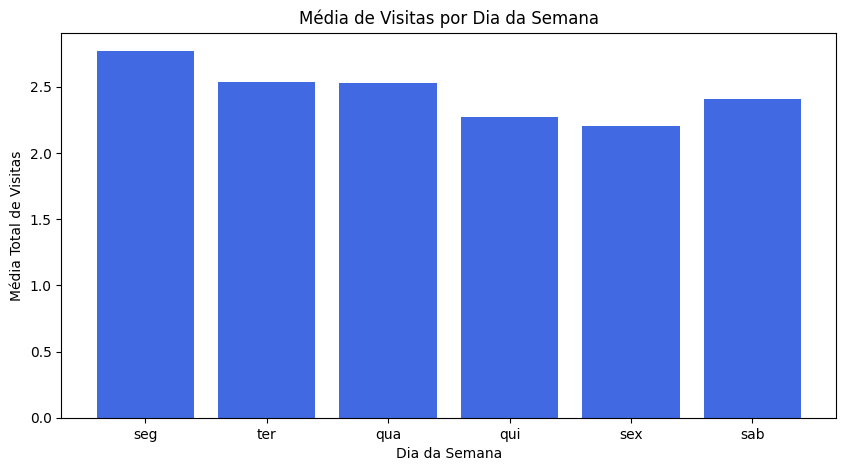

In [ ]:
import matplotlib.pyplot as plt

# Definir a ordem correta dos dias da semana
ordem_dias = ["seg", "ter", "qua", "qui", "sex", "sab", "dom"]

# Ordenar os dias corretamente
media_visitas_total["Dia da Semana"] = pd.Categorical(media_visitas_total["Dia da Semana"], categories=ordem_dias, ordered=True)
media_visitas_total = media_visitas_total.sort_values("Dia da Semana")

# **Criar um gráfico de barras**
plt.figure(figsize=(10,5))
plt.bar(media_visitas_total["Dia da Semana"], media_visitas_total["Média Total de Visitas"], color="royalblue")
plt.xlabel("Dia da Semana")
plt.ylabel("Média Total de Visitas")
plt.title("Média de Visitas por Dia da Semana")
plt.show()

🔹  - Alguns vendedores absorveram mais de um cluster, otimizando a distribuição.

🔹  - Vendedores que estavam com poucos POCs foram eliminados para melhorar a eficiência.

🔹  - O processo de balanceamento tentou minimizar a quantidade de vendedores necessários.

In [ ]:
# Definir o vendedor a ser visualizado
vendedor_selecionado = "ECECB033"  # Substitua pelo vendedor desejado

# Filtrar os POCs do vendedor selecionado
df_vendedor = df[df["Vendedor_Atribuído"] == vendedor_selecionado]

# Verificar se o vendedor tem POCs atribuídos
if df_vendedor.empty:
    print(f"O vendedor {vendedor_selecionado} não tem POCs atribuídos!")
else:
    print(f"O vendedor {vendedor_selecionado} tem {len(df_vendedor)} POCs atribuídos.")

# Verificar se há valores NaN nas coordenadas
print(f"Valores NaN na Latitude: {df_vendedor['AVG_LATITUDE'].isna().sum()}")
print(f"Valores NaN na Longitude: {df_vendedor['AVG_LONGITUDE'].isna().sum()}")

# Verificar a média das coordenadas
lat_media = df_vendedor["AVG_LATITUDE"].mean()
lon_media = df_vendedor["AVG_LONGITUDE"].mean()
print(f"Média de Latitude: {lat_media}, Média de Longitude: {lon_media}")

O vendedor ECECB033 tem 338 POCs atribuídos.
Valores NaN na Latitude: 0
Valores NaN na Longitude: 0
Média de Latitude: -0.11755436050781067, Média de Longitude: -78.46895144845169


In [ ]:
pd.set_option('display.max_columns', None)
df

,COUNTRY_NAME,POC,Vendedor,Frequência_de_Visita,Dia_da_Visita,Semana_da_Visita,AVG_LATITUDE,AVG_LONGITUDE,Número_de_Compras,Faturamento_Mensal_USD,Faturamento_Mensal_USD_(formatado),Visita_Semanal,Semana_1,Semana_2,Semana_3,Semana_4,Dia_da_Semana,Quartil_Faturamento,Cluster,Vendedor_Atribuído,Alto_Valor,Frequência_Ajustada,Delta_Lat,Delta_Lon,Distância_Km_Lat,Distância_Km_Lon,Distância_Total_Km
0,EC,11802893,ECECB614,2,4,1.0,-1.116441,-80.403880,5,655.51,$655.51,0.50,1,0,0,0,qua,Q3,147,ECECB611,False,2,NaN,NaN,NaN,NaN,14.450933
1,EC,11803224,ECECB011,2,5,1.0,-3.553245,-80.064513,6,808.20,$808.20,0.50,1,0,0,0,qui,Q3,110,ECECB011,False,2,NaN,NaN,NaN,NaN,12.268897
2,EC,11803330,ECECB276,2,4,1.0,-2.740126,-78.845570,8,584.77,$584.77,0.50,1,0,0,0,qua,Q2,376,ECECB089,False,2,NaN,NaN,NaN,NaN,2.944183
3,EC,11803418,ECECB274,2,5,2.0,-2.806572,-78.773606,3,777.05,$777.05,0.50,0,1,0,0,qui,Q3,120,ECECB089,False,2,NaN,NaN,NaN,NaN,9.246116
4,EC,11803517,ECECB282,4,3,CMPL,-2.742844,-78.849740,8,103820.37,"$103,820.37",1.00,1,1,1,1,ter,Q4,376,ECECB089,True,4,NaN,NaN,NaN,NaN,76.979280
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44038,EC,14236381,ECECBA18,1,3,3.0,-3.324675,-79.720375,3,696.40,$696.40,0.25,0,0,1,0,ter,Q3,392,ECECBA18,False,1,0.009501,0.081032,1.054574,8.979458,10.034032
44039,EC,14237231,ECECB337,1,2,4.0,-0.307164,-78.454020,3,792.76,$792.76,0.25,0,0,0,1,seg,Q3,265,ECECB019,False,1,0.011649,0.009956,1.293061,1.105100,2.398161
44040,EC,14237651,ECECB044,2,6,2.0,-1.281191,-78.640096,1,620.63,$620.63,0.50,0,1,0,0,sex,Q3,358,ECECB595,False,2,0.044994,0.048610,4.994378,5.394306,10.388684
44041,EC,14239714,ECECB061,1,6,3.0,-0.436454,-76.992425,5,265.45,$265.45,0.25,0,0,1,0,sex,Q1,368,ECECB318,False,1,0.009830,0.000927,1.091137,0.102916,1.194054


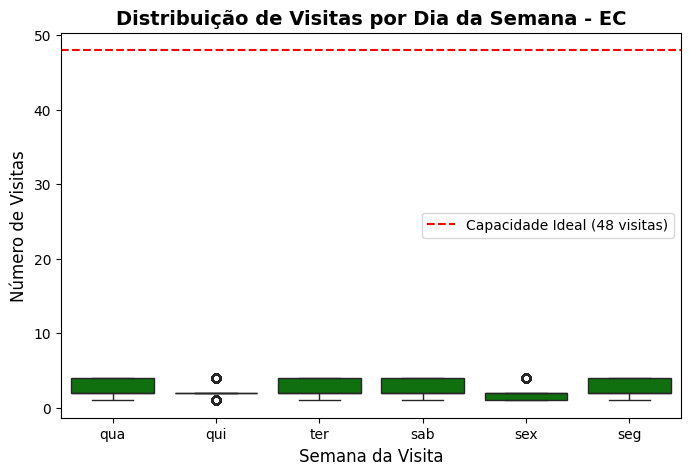

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Verificar se a coluna existe e o DataFrame não está vazio
if "Frequência_Ajustada" in df.columns and not df.empty:

    # Configuração do gráfico
    plt.figure(figsize=(8, 5))
    sns.boxplot(x="Dia_da_Semana", y="Frequência_Ajustada", data=df, color="green", showfliers=True)

    # Adicionar linha da capacidade ideal (48 visitas)
    plt.axhline(y=48, color='red', linestyle="--", linewidth=1.5, label="Capacidade Ideal (48 visitas)")

    # Personalizar rótulos e título
    plt.xlabel("Semana da Visita", fontsize=12)
    plt.ylabel("Número de Visitas", fontsize=12)
    plt.title("Distribuição de Visitas por Dia da Semana - EC", fontsize=14, fontweight="bold")

    # Adicionar legenda
    plt.legend()

    # Exibir o gráfico
    plt.show()
else:
    print("Erro: A coluna 'Frequência_Ajustada' não existe ou o DataFrame está vazio.")

## Analise de faturamento

In [ ]:
# Filtrar os vendedores que fazem menos de 200 visitas
vendedores_menos_200_visitas = visitas_por_vendedor[visitas_por_vendedor < 200].index
df_menos_200_visitas = df[df["Vendedor_Atribuído"].isin(vendedores_menos_200_visitas)]

# Calcular o faturamento total desses vendedores
faturamento_menos_200_visitas = df_menos_200_visitas.groupby("Vendedor_Atribuído")["Faturamento_Mensal_USD"].sum().reset_index()

# Renomear as colunas para melhor entendimento
faturamento_menos_200_visitas.columns = ["Vendedor", "Faturamento_Total"]

faturamento_menos_200_visitas


,Vendedor,Faturamento_Total
0,ECECB614,141012.08


In [ ]:
faturamento_menos_200_visitas['Vendedor'].count()


np.int64(1)

In [ ]:
faturamento_menos_200_visitas['Faturamento_Total'].sum()

np.float64(141012.08000000002)

In [ ]:
faturamento_menos_200_visitas['Faturamento_Total'].describe()

count         1.00
mean     141012.08
std            NaN
min      141012.08
25%      141012.08
50%      141012.08
75%      141012.08
max      141012.08
Name: Faturamento_Total, dtype: float64

- Os vendedores que possuem menos visitas são de suma importancia para o faturamento total representando 2,15%.
- Pela analise, os vendedores que tem menos visitas são vendedores de beira de estrada. Distante dos grandes centros...

## Analise de carga horaria

In [ ]:
# Definir o tempo médio de cada visita em minutos
tempo_por_visita = 10  # 10 minutos por visita
max_carga_horaria = 480  # 8 horas de trabalho = 480 minutos

# Calcular o tempo total gasto por vendedor
df["Carga_Horaria_Min"] = df["Frequência_Ajustada"] * tempo_por_visita

# Calcular a carga horária diária por vendedor em horas
carga_horaria_por_vendedor = df.groupby("Vendedor_Atribuído")["Carga_Horaria_Min"].sum() / 60  # Converter minutos para horas

# Criar uma nova coluna no dataframe para registrar a carga horária em horas
df["Carga_Horaria_Horas"] = df["Carga_Horaria_Min"] / 60  # Converter para horas

# Exibir o resultado
df

,COUNTRY_NAME,POC,Vendedor,Frequência_de_Visita,Dia_da_Visita,Semana_da_Visita,AVG_LATITUDE,AVG_LONGITUDE,Número_de_Compras,Faturamento_Mensal_USD,Faturamento_Mensal_USD_(formatado),Visita_Semanal,Semana_1,Semana_2,Semana_3,Semana_4,Dia_da_Semana,Quartil_Faturamento,Cluster,Vendedor_Atribuído,Alto_Valor,Frequência_Ajustada,Delta_Lat,Delta_Lon,Distância_Km_Lat,Distância_Km_Lon,Distância_Total_Km,Carga_Horaria_Min,Carga_Horaria_Horas
0,EC,11802893,ECECB614,2,4,1.0,-1.116441,-80.403880,5,655.51,$655.51,0.50,1,0,0,0,qua,Q3,147,ECECB611,False,2,NaN,NaN,NaN,NaN,14.450933,20,0.333333
1,EC,11803224,ECECB011,2,5,1.0,-3.553245,-80.064513,6,808.20,$808.20,0.50,1,0,0,0,qui,Q3,110,ECECB011,False,2,NaN,NaN,NaN,NaN,12.268897,20,0.333333
2,EC,11803330,ECECB276,2,4,1.0,-2.740126,-78.845570,8,584.77,$584.77,0.50,1,0,0,0,qua,Q2,376,ECECB089,False,2,NaN,NaN,NaN,NaN,2.944183,20,0.333333
3,EC,11803418,ECECB274,2,5,2.0,-2.806572,-78.773606,3,777.05,$777.05,0.50,0,1,0,0,qui,Q3,120,ECECB089,False,2,NaN,NaN,NaN,NaN,9.246116,20,0.333333
4,EC,11803517,ECECB282,4,3,CMPL,-2.742844,-78.849740,8,103820.37,"$103,820.37",1.00,1,1,1,1,ter,Q4,376,ECECB089,True,4,NaN,NaN,NaN,NaN,76.979280,40,0.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44038,EC,14236381,ECECBA18,1,3,3.0,-3.324675,-79.720375,3,696.40,$696.40,0.25,0,0,1,0,ter,Q3,392,ECECBA18,False,1,0.009501,0.081032,1.054574,8.979458,10.034032,10,0.166667
44039,EC,14237231,ECECB337,1,2,4.0,-0.307164,-78.454020,3,792.76,$792.76,0.25,0,0,0,1,seg,Q3,265,ECECB019,False,1,0.011649,0.009956,1.293061,1.105100,2.398161,10,0.166667
44040,EC,14237651,ECECB044,2,6,2.0,-1.281191,-78.640096,1,620.63,$620.63,0.50,0,1,0,0,sex,Q3,358,ECECB595,False,2,0.044994,0.048610,4.994378,5.394306,10.388684,20,0.333333
44041,EC,14239714,ECECB061,1,6,3.0,-0.436454,-76.992425,5,265.45,$265.45,0.25,0,0,1,0,sex,Q1,368,ECECB318,False,1,0.009830,0.000927,1.091137,0.102916,1.194054,10,0.166667


In [ ]:
df["Carga_Horaria_Horas"].describe()


count    44043.000000
mean         0.413270
std          0.182671
min          0.166667
25%          0.333333
50%          0.333333
75%          0.666667
max          0.666667
Name: Carga_Horaria_Horas, dtype: float64

In [ ]:
# Calcular a carga horária total diária por vendedor
carga_horaria_vendedor = df.groupby("Vendedor_Atribuído")["Carga_Horaria_Horas"].sum().reset_index()

# Renomear colunas para clareza
carga_horaria_vendedor.columns = ["Vendedor", "Carga_Horaria_Total_Horas"]

carga_horaria_vendedor.sort_values(by="Carga_Horaria_Total_Horas", ascending=False, inplace=True)
carga_horaria_vendedor.head(50)

,Vendedor,Carga_Horaria_Total_Horas
96,ECECB256,246.666667
23,ECECB037,246.666667
244,ECECBA30,217.000000
164,ECECB507,191.000000
88,ECECB225,189.333333
92,ECECB242,181.666667
174,ECECB540,179.166667
12,ECECB021,178.166667
104,ECECB273,170.000000
62,ECECB104,165.666667


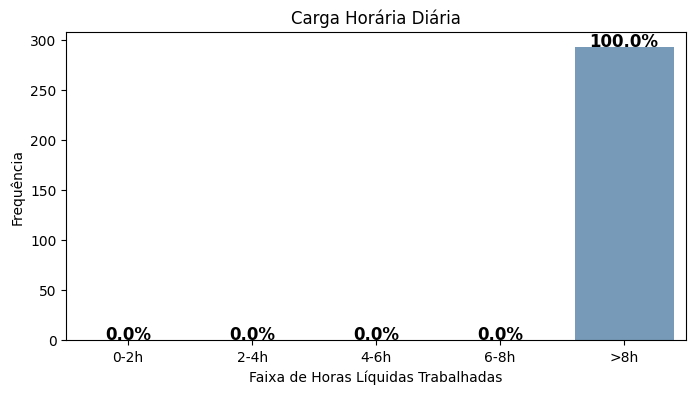

In [ ]:
# Criar faixas de carga horária
bins = [0, 2, 4, 6, 8, np.inf]  # Definição dos intervalos
labels = ["0-2h", "2-4h", "4-6h", "6-8h", ">8h"]

# Criar uma nova coluna categorizando a carga horária total
carga_horaria_vendedor["Faixa_Carga_Horaria"] = pd.cut(carga_horaria_vendedor["Carga_Horaria_Total_Horas"], bins=bins, labels=labels, right=False)

# Contar a frequência de cada faixa
frequencia_carga_horaria = carga_horaria_vendedor["Faixa_Carga_Horaria"].value_counts().sort_index()

# Calcular porcentagem
total = frequencia_carga_horaria.sum()
percentuais = (frequencia_carga_horaria / total) * 100

# Criar gráfico
plt.figure(figsize=(8, 4))
sns.barplot(x=percentuais.index, y=frequencia_carga_horaria, color="steelblue", alpha=0.8)

# Adicionar valores percentuais acima das barras
for i, valor in enumerate(frequencia_carga_horaria):
    plt.text(i, valor + 0.5, f"{percentuais.iloc[i]:.1f}%", ha="center", fontsize=12, fontweight="bold")

# Configurações do gráfico
plt.xlabel("Faixa de Horas Líquidas Trabalhadas")
plt.ylabel("Frequência")
plt.title("Carga Horária Diária")
plt.show()


## Analise de faturamento

In [ ]:
# Definir as faixas de faturamento (corrigidas)
bins = [1000, 2000, 5000, 7000, 10000, 25000, float("inf")]
labels = ["1K - 2K", "2K - 5K", "5K - 7K", "7K - 10K", "10K - 25K", "Mais de 25K"]

# Criar uma nova coluna categorizando os faturamentos
df["Faixa_Faturamento"] = pd.cut(df["Faturamento_Mensal_USD"], bins=bins, labels=labels, right=False)

# Contar a quantidade de POCs por faixa de faturamento (em %)
distribuicao_faturamento = df["Faixa_Faturamento"].value_counts(normalize=True).sort_index() * 100

In [ ]:
import plotly.express as px

# Criar o gráfico de barras interativo
fig = px.bar(distribuicao_faturamento, x=distribuicao_faturamento.index, y=distribuicao_faturamento.values, 
             labels={'x': 'Faixas de Faturamento', 'y': 'Proporção de POCs (%)'},
             title='Distribuição das POCs por Faixa de Faturamento')

# Adicionar rótulos de percentual no topo das barras
fig.update_traces(texttemplate='%{y:.1f}%', textposition='outside')

# Configurar layout com largura menor
fig.update_layout(yaxis_title='Proporção de POCs (%)', xaxis_title='Faixas de Faturamento', 
                  title={'text': 'Distribuição das POCs por Faixa de Faturamento', 'x':0.5},
                  width=600, height=600)

# Exibir o gráfico
fig.show()


# Analise de faturamento / visita

In [ ]:
import pandas as pd

# **Garantir que Segmento_Faturamento não seja recriado**
if "Segmento_Faturamento" not in df.columns:
    bins = [0, 1000, 5000, float("inf")]
    labels = ["Baixo", "Médio", "Alto"]
    df["Segmento_Faturamento"] = pd.cut(df["Faturamento_Mensal_USD"], bins=bins, labels=labels, right=False)

# **Garantir que Categoria_Frequencia não seja recriada**
if "Categoria_Frequencia" not in df.columns:
    def classificar_frequencia(freq):
        if freq == 1:
            return "Mensal"
        elif freq == 2:
            return "Quinzenal"
        elif freq >= 4:
            return "Semanal"
        return "Outros"

    df["Categoria_Frequencia"] = df["Frequência_Ajustada"].apply(classificar_frequencia)

# **Agora calcular a proporção corretamente**
proporcao_visitas = (
    df.groupby(["Segmento_Faturamento", "Categoria_Frequencia"])
    .size()
    .unstack(fill_value=0)  # Garante que valores ausentes sejam preenchidos com 0
)

# **Transformar os valores em proporções (percentuais)**
proporcao_visitas = proporcao_visitas.div(proporcao_visitas.sum(axis=1), axis=0) * 100

C:\Users\jmana\AppData\Local\Temp\ipykernel_19504\1988939149.py:24: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



## **Mapas**

In [ ]:
import folium
import numpy as np

# Definir o vendedor que deseja visualizar
vendedor_selecionado = "ECECB046"  # Substitua pelo vendedor desejado

# Filtrar o DataFrame para exibir apenas os POCs do vendedor selecionado
df_vendedor = df[df["Vendedor_Atribuído"] == vendedor_selecionado]

# Calcular a média de quilômetros percorridos pelo vendedor
media_km_vendedor = df_vendedor["Distância_Total_Km"].mean()

# Criar um mapa centralizado na média das coordenadas do vendedor
map_center = [df_vendedor["AVG_LATITUDE"].mean(), df_vendedor["AVG_LONGITUDE"].mean()]
mapa_vendedor = folium.Map(location=map_center, zoom_start=6)

# Definir cores para os dias da semana
cores_dias = {
    "seg": "blue",
    "ter": "green",
    "qua": "red",
    "qui": "purple",
    "sex": "orange",
    "sab": "pink",
    "dom": "brown"
}

# Criar FeatureGroup para cada dia da semana
dias_unicos = df_vendedor["Dia_da_Semana"].dropna().unique()
dias_feature = {dia: folium.FeatureGroup(name=f"Dia {dia}") for dia in dias_unicos}

# Adicionar POCs ao mapa coloridos pelo dia da semana
for _, row in df_vendedor.iterrows():
    dia = row["Dia_da_Semana"].lower() if isinstance(row["Dia_da_Semana"], str) else "outros"
    cor = cores_dias.get(dia, "gray")  # Cor padrão caso o dia não esteja no dicionário

    if pd.notna(row["AVG_LATITUDE"]) and pd.notna(row["AVG_LONGITUDE"]):
        folium.CircleMarker(
            location=[row["AVG_LATITUDE"], row["AVG_LONGITUDE"]],
            radius=5,
            color=cor,
            fill=True,
            fill_color=cor,
            fill_opacity=0.7,
            popup=folium.Popup(f"""
                <b>Vendedor:</b> {row["Vendedor_Atribuído"]} <br>
                <b>POC:</b> {row["POC"]} <br>
                <b>Faturamento:</b> ${row["Faturamento_Mensal_USD"]:.2f} <br>
                <b>Distância:</b> {row["Distância_Total_Km"]:.2f} km <br>
                <b>Dia da Visita:</b> {row["Dia_da_Semana"]} <br>
                <b>Frequência de Visita:</b> {row["Frequência_Ajustada"]} vezes/mês <br>
                <b>Média de KM Percorridos pelo Vendedor:</b> {media_km_vendedor:.2f} km
            """, max_width=250),
        ).add_to(dias_feature[dia])

# Adicionar grupos ao mapa
for dia in dias_feature.values():
    dia.add_to(mapa_vendedor)

# Adicionar controle de camadas
folium.LayerControl().add_to(mapa_vendedor)

# Exibir o mapa interativo
mapa_vendedor

In [ ]:
import folium
import numpy as np

# Criar um mapa centralizado na média das coordenadas
map_center = [df["AVG_LATITUDE"].mean(), df["AVG_LONGITUDE"].mean()]
mapa_clusters = folium.Map(location=map_center, zoom_start=6)

# Criar um dicionário de cores para os clusters
clusters_unicos = df["Cluster"].unique()
cores = ["#" + ''.join(np.random.choice(list('0123456789ABCDEF'), 6)) for _ in range(len(clusters_unicos))]
cluster_cores = dict(zip(clusters_unicos, cores))

# Criar FeatureGroup para cada cluster
clusters_feature = {cluster: folium.FeatureGroup(name=f"Cluster {cluster}") for cluster in clusters_unicos}

# Adicionar POCs ao mapa coloridos pelos clusters
for _, row in df.iterrows():
    cluster = row["Cluster"]
    if pd.notna(row["AVG_LATITUDE"]) and pd.notna(row["AVG_LONGITUDE"]):
        folium.CircleMarker(
            location=[row["AVG_LATITUDE"], row["AVG_LONGITUDE"]],
            radius=5,
            color=cluster_cores[cluster],
            fill=True,
            fill_color=cluster_cores[cluster],
            fill_opacity=0.7,
            popup=folium.Popup(f"""
                <b>Cluster:</b> {cluster} <br>
                <b>Vendedor:</b> {row["Vendedor_Atribuído"]} <br>
                <b>POC:</b> {row["POC"]} <br>
                <b>Faturamento:</b> ${row["Faturamento_Mensal_USD"]:.2f} <br>
                <b>Distância:</b> {row["Distância_Total_Km"]:.2f} km
                <b>Dia da Visita:</b> {row["Dia_da_Semana"]}<br>
                <b>Frequência de Visita:</b> {row["Frequência_Ajustada"]} vezes/mês
            """, max_width=250),
        ).add_to(clusters_feature[cluster])

# Adicionar grupos ao mapa
for cluster in clusters_feature.values():
    cluster.add_to(mapa_clusters)

# Adicionar controle de camadas
folium.LayerControl().add_to(mapa_clusters)

# Exibir o mapa interativo
mapa_clusters

In [ ]:
import folium
import numpy as np

# Filtrar os vendedores que têm menos de 20 visitas
vendedores_menos_20_visitas = visitas_por_vendedor[visitas_por_vendedor < 20].index
df_menos_20_visitas = df[df["Vendedor_Atribuído"].isin(vendedores_menos_20_visitas)]

# Criar um mapa centralizado na média das coordenadas
map_center = [df_menos_20_visitas["AVG_LATITUDE"].mean(), df_menos_20_visitas["AVG_LONGITUDE"].mean()]
mapa_menos_20_visitas = folium.Map(location=map_center, zoom_start=6)

# Criar um dicionário de cores para os clusters
clusters_unicos = df_menos_20_visitas["Cluster"].unique()
cores = ["#" + ''.join(np.random.choice(list('0123456789ABCDEF'), 6)) for _ in range(len(clusters_unicos))]
cluster_cores = dict(zip(clusters_unicos, cores))

# Criar FeatureGroup para cada cluster
clusters_feature = {cluster: folium.FeatureGroup(name=f"Cluster {cluster}") for cluster in clusters_unicos}

# Adicionar POCs ao mapa coloridos pelos clusters
for _, row in df_menos_20_visitas.iterrows():
    cluster = row["Cluster"]
    if pd.notna(row["AVG_LATITUDE"]) and pd.notna(row["AVG_LONGITUDE"]):
        folium.CircleMarker(
            location=[row["AVG_LATITUDE"], row["AVG_LONGITUDE"]],
            radius=5,
            color=cluster_cores[cluster],
            fill=True,
            fill_color=cluster_cores[cluster],
            fill_opacity=0.7,
            popup=folium.Popup(f"""
                <b>Cluster:</b> {cluster} <br>
                <b>Vendedor:</b> {row["Vendedor_Atribuído"]} <br>
                <b>POC:</b> {row["POC"]} <br>
                <b>Faturamento:</b> ${row["Faturamento_Mensal_USD"]:.2f} <br>
                <b>Distância:</b> {row["Distância_Total_Km"]:.2f} km
                <b>Dia da Visita:</b> {row["Dia_da_Semana"]}<br>
                <b>Frequência de Visita:</b> {row["Frequência_Ajustada"]} vezes/mês
            """, max_width=250),
        ).add_to(clusters_feature[cluster])

# Adicionar grupos ao mapa
for cluster in clusters_feature.values():
    cluster.add_to(mapa_menos_20_visitas)

# Adicionar controle de camadas
folium.LayerControl().add_to(mapa_menos_20_visitas)

# Exibir o mapa interativo
mapa_menos_20_visitas